<a href="https://colab.research.google.com/github/vocanalytics/dogbreed/blob/main/dog_breed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle


# Yeni Bölüm

In [4]:
from google.colab import files

# API anahtarlarınızın bulunduğu JSON dosyasını seçin
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"voclistener","key":"d89aa61123b58a4cdc879fb9a315ba63"}'}

In [5]:
# Kaggle API anahtarlarını doğru konumda saklayın
import os
os.environ["KAGGLE_CONFIG_DIR"] = "/content/"



In [6]:
!kaggle competitions download -c dog-breed-identification

 98% 677M/691M [00:04<00:00, 160MB/s]
100% 691M/691M [00:04<00:00, 171MB/s]


In [7]:
# Veriyi çıkartın
!unzip -q dog-breed-identification.zip -d data/


# IMPORTING LIBRARIES

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten,Input,Dropout,MaxPooling2D
from tensorflow.keras import datasets, layers, models
from tensorflow.math import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import EfficientNetB4, Xception, ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
import random
import os
import cv2
import warnings
warnings.filterwarnings('ignore')





In [9]:
df = pd.read_csv('/content/data/labels.csv')


In [10]:
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
df.shape

(10222, 2)

In [12]:
df.isnull().sum()

id       0
breed    0
dtype: int64

In [20]:
unique_labels= df['breed'].nunique()
label_percentage=df['breed'].value_counts(normalize=True)*100

In [21]:
# Sonuçları yazdır
print(f"Unique Label Amount: {unique_labels}")
print("Label PErcentage:")
print(label_percentage)

Benzersiz etiket sayısı: 120
Etiket yüzdesi:
scottish_deerhound      1.232635
maltese_dog             1.144590
afghan_hound            1.134807
entlebucher             1.125024
bernese_mountain_dog    1.115242
                          ...   
golden_retriever        0.655449
brabancon_griffon       0.655449
komondor                0.655449
eskimo_dog              0.645666
briard                  0.645666
Name: breed, Length: 120, dtype: float64


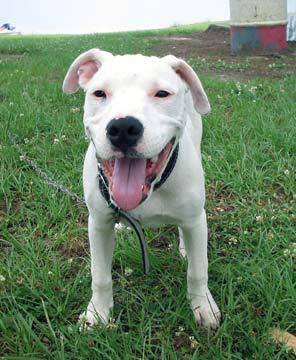

In [26]:
from IPython.display import display, Image
Image("/content/data/train/02f3d5fd1eea0a2e6f4742bc54b51ba9.jpg")

In [27]:
# Create pathnames from image ID's
filenames = ['/content/data/train/' + fname + ".jpg" for fname in df["id"]]

# Check the first 10
filenames[:10]

['/content/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [28]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('/content/data/train')) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of file, check the target directory.")

Filenames match actual amount of files!!! Proceed.


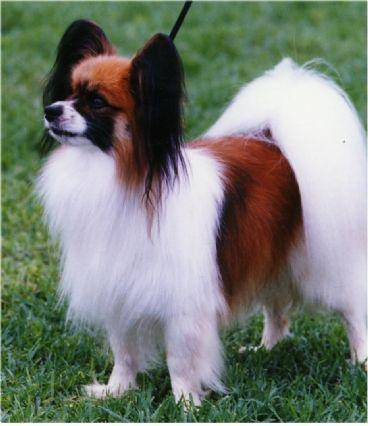

In [29]:
# One more check
from IPython.display import Image
Image(filenames[3500])

In [30]:
df["breed"][3500]

'papillon'

In [31]:
import numpy as np
labels = df["breed"].to_numpy()
#labels = np.array(labels) does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [32]:
len(labels)

10222

In [35]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [36]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [37]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [38]:
len(boolean_labels)

10222

In [39]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [40]:
print(labels[5])
print(boolean_labels[5].astype(int))

bedlington_terrier
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Creating our validation set

In [41]:
# Setup X & y variables
X = filenames
y = boolean_labels


In [42]:
# Set number of imagess to use for experimenting
NUM_IMAGES = 2000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [43]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(1600, 1600, 400, 400)

# Preprocessing Images (turning images into Tensors)

To preprocess our images to Tensors we're going to write a function which does a few things:
*   Take an image filepath as input
*   Use TensorFlow to read the file and save it to a variable,image
*   Turn our image (a jpg) into Tensors
*   Resize the image to be shape of (224, 224)
*   Return the modified image

Before we do, let's see what importing an image looks like.

In [44]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [45]:
image.max(), image.min()

(255, 0)

In [46]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

let's make a function to preprocess them.

*   Take an image filepath as input
*   Use TensorFlow to read the file and save it to a variable, image
*   Turn our image (a jpg) into Tensors
*   Normalize our image (convert color channel values from 0-255 to 0-1).
*   Resize the image to be shape of (224, 224)
*   Return the modified image





In [47]:
# Define image size
IMG_SIZE = 224


# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Take an image file path and turns the image into Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
    # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
   # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
   # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

In [48]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label,
  processes the image and return a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [49]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a funtion to turn all of our data (X & y) into batches!

In [51]:
# Define the batch size.
BATCH_SIZE = 32


# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data  = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the images path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [52]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [53]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches¶

In [54]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 26 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [55]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

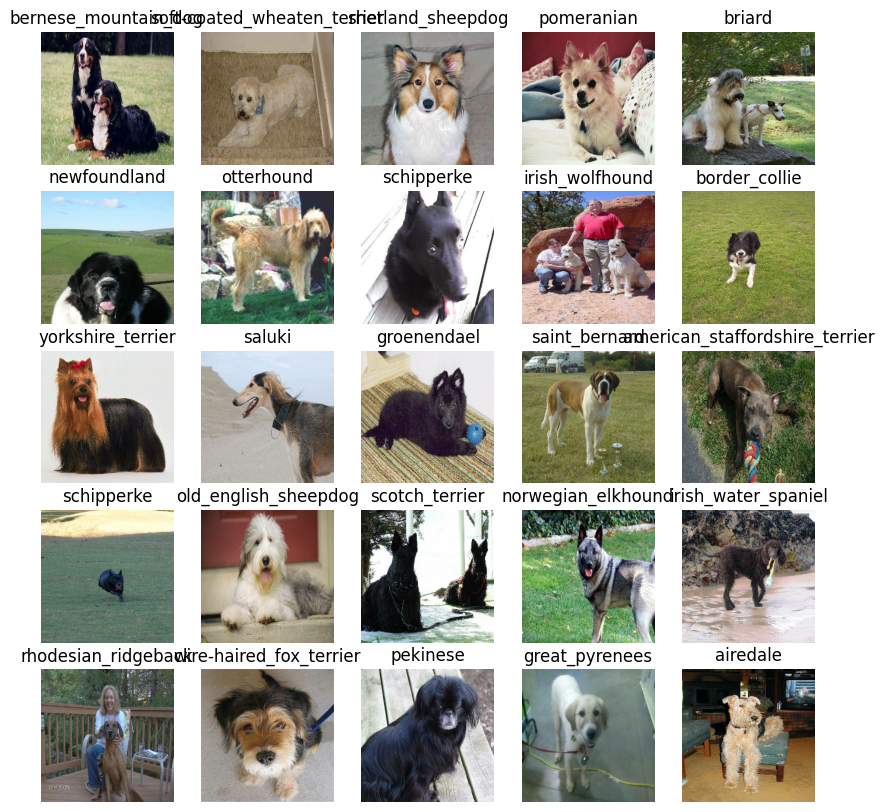

In [56]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

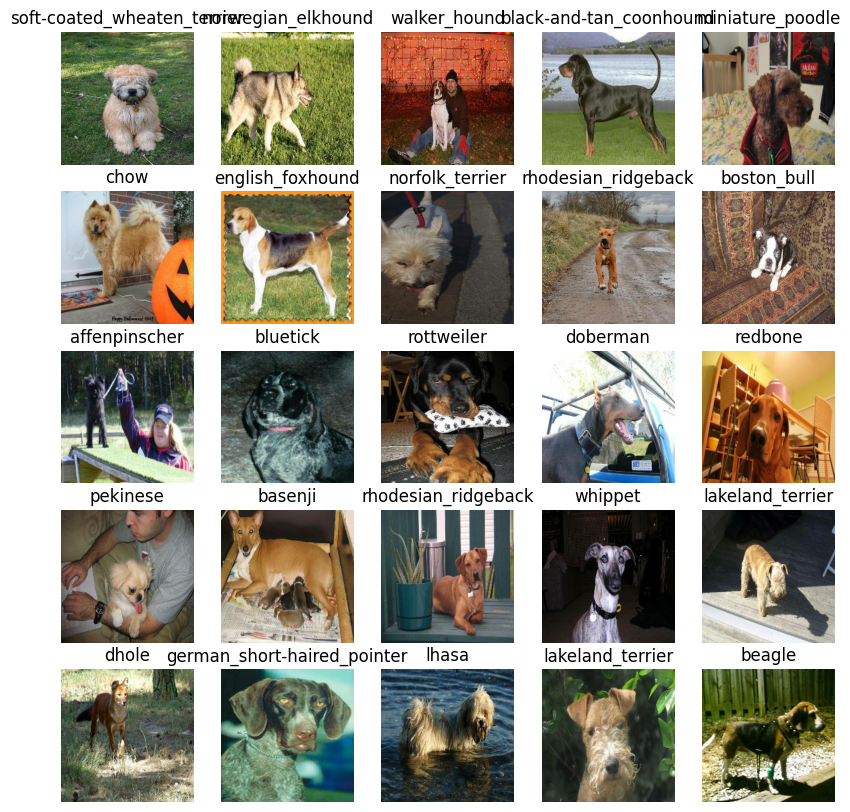

In [57]:
# visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

#Before we build a model, there are a few things we need to define:



*   The input shape (our images shape, in the form of Tensors) to our model.
*   The output shape (image labels, in the form of Tensors) of our model.
*   The URL of the model we want to use from TensorFlow Hub -

In [58]:
IMG_SIZE

224

In [59]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5"

Now we've got our inputs, outputs and model ready to go.Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

*  Takes the input shape, output shape and the model we've chosen as parameters.
*  Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [63]:
import tensorflow_hub as hub
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)


  # Setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [64]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


**Creating callbacks**
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

**TensorBoard Callback**
To setup a TensorBoard callback we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [65]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [66]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/kaggle/working/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


  return tf.keras.callbacks.TensorBoard(logdir)

# Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [68]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)


# Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [74]:
NUM_EPOCHS = 20 # @param {type:"slider", min:10, max:100, step:10}

In [75]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not avilable")

GPU not avilable


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [76]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version,
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [77]:
# Fit the model
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Epoch 1/20
50/50 [==============================] - 170s 3s/step - loss: 3.5326 - accuracy: 0.2681 - val_loss: 1.8414 - val_accuracy: 0.5775
Epoch 2/20
50/50 [==============================] - 180s 4s/step - loss: 0.8262 - accuracy: 0.8512 - val_loss: 1.1113 - val_accuracy: 0.7125
Epoch 3/20
50/50 [==============================] - 179s 4s/step - loss: 0.3146 - accuracy: 0.9644 - val_loss: 0.9690 - val_accuracy: 0.7325
Epoch 4/20
50/50 [==============================] - 213s 4s/step - loss: 0.1678 - accuracy: 0.9862 - val_loss: 0.8993 - val_accuracy: 0.7450
Epoch 5/20
50/50 [==============================] - 148s 3s/step - loss: 0.1045 - accuracy: 0.9981 - val_loss: 0.8693 - val_accuracy: 0.7625
Epoch 6/20
50/50 [==============================] - 147s 3s/step - loss: 0.0748 - accuracy: 0.9981 - val_loss: 0.8472 - val_accuracy: 0.7625
Epoch 7/20
50/50 [==============================] - 151s 3s/s

# Checking the TensorBoard logs¶
The TensorBoard magic function (%tensorboard) will access the log directory we created earlier and visualize its contents .

In [78]:
%tensorboard --logdir /kaggle/working/logs

<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [79]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [81]:
# Make prediciton on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

13/13 [==============================] - 36s 2s/step


array([[4.73716646e-05, 1.13815777e-01, 4.17083393e-05, ...,
        3.14589910e-04, 2.20315807e-04, 2.65806993e-05],
       [8.70425447e-06, 8.55676353e-06, 4.19794196e-06, ...,
        4.98355585e-05, 6.62431412e-05, 1.04163164e-05],
       [1.89449856e-05, 3.69529647e-04, 1.24665487e-04, ...,
        8.78264457e-02, 2.09621922e-03, 6.04313864e-05],
       ...,
       [1.22579113e-05, 3.20697762e-03, 1.88628092e-05, ...,
        1.28062675e-05, 3.33983508e-06, 1.25287734e-05],
       [3.37751902e-04, 1.44832720e-05, 3.57067256e-05, ...,
        1.83946890e-04, 1.89797312e-03, 1.49752130e-03],
       [2.15355612e-05, 2.23285060e-05, 1.54999835e-08, ...,
        5.80263077e-07, 3.00395709e-06, 5.20846868e-07]], dtype=float32)

In [82]:
# First prediction
index = 42
print(predictions[0])
print(f"Maxvalue (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predictions label: {unique_breeds[np.argmax(predictions[index])]}")

[4.73716646e-05 1.13815777e-01 4.17083393e-05 1.11726709e-02
 9.55582829e-04 6.00653584e-06 4.23559186e-06 3.93720147e-05
 1.08714600e-03 8.89036528e-05 1.59193267e-04 2.57235806e-04
 1.18554533e-04 1.25596242e-04 1.52955865e-02 2.26007796e-05
 2.43630402e-05 1.02462724e-01 1.15101735e-04 1.19034499e-04
 5.23497388e-02 1.17453316e-03 8.08252007e-05 1.28522202e-01
 3.46452580e-05 1.63495801e-02 3.05090342e-02 1.27900814e-04
 8.69833675e-05 4.34850263e-05 2.30381149e-03 1.40233577e-04
 1.77513016e-03 1.07306929e-03 1.47602826e-04 6.18548971e-03
 2.31423455e-05 1.34614855e-03 8.36131687e-04 1.74293877e-04
 1.11632957e-03 2.16579341e-04 1.35521550e-04 1.56556474e-04
 1.68237511e-05 1.33291658e-04 6.58598961e-04 6.84104452e-05
 2.10671267e-03 1.85505502e-04 5.30298203e-05 6.34195283e-04
 4.43318073e-04 1.07652450e-04 5.49283031e-05 9.87628027e-06
 6.71567477e-06 3.39699618e-04 8.43765520e-06 7.74058700e-02
 8.19830748e-05 1.27533640e-05 3.97104923e-05 2.57203283e-05
 1.87133206e-03 3.027488

In [84]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
    """
    Turns an array of predicitions probabilities into labels.
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label= get_pred_label(predictions[81])
pred_label

'mexican_hairless'

Now since our validation data is still in a batch dataset, we'll have unbatchify it to make predictions on the validation images and compare those predictions to the validation labels(truth labels).

In [85]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [86]:
# Create a function to unbatch a batch dataset
def unbatchify(batch_data):
    """
    Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
    """
    images = []
    labels = []
    # Loop through unbatched data
    for image, label in batch_data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.28940946, 0.3325467 , 0.17568395],
         [0.2501433 , 0.29330748, 0.13644473],
         [0.2876167 , 0.3342017 , 0.17733893],
         ...,
         [0.5164206 , 0.5776601 , 0.33903962],
         [0.54773974, 0.6089793 , 0.3703588 ],
         [0.50159407, 0.56283355, 0.32421306]],
 
        [[0.27667817, 0.3276586 , 0.15903112],
         [0.30975384, 0.3608085 , 0.19218104],
         [0.33957785, 0.39721096, 0.22858347],
         ...,
         [0.491509  , 0.5575804 , 0.28604677],
         [0.5702347 , 0.6363061 , 0.36477253],
         [0.5313855 , 0.59745693, 0.32592332]],
 
        [[0.29069865, 0.35518688, 0.17861006],
         [0.29807582, 0.36118335, 0.18470922],
         [0.31007844, 0.37737536, 0.20058963],
         ...,
         [0.50055254, 0.56690407, 0.29036346],
         [0.5573835 , 0.623735  , 0.3471944 ],
         [0.55167574, 0.61802727, 0.34148666]],
 
        ...,
 
        [[0.24473517, 0.27916905, 0.13407102],
         [0.04194383, 0.08529994, 0.00537

Now we've got ways to get:

* Prediction labels
* Validation labels(truth labels)
* Validation images
Let's make some function to make these all a bit more visualize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [87]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth and image for sample n
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

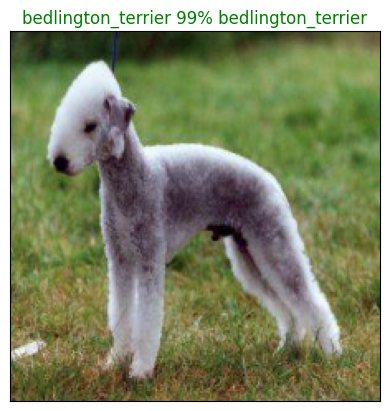

In [88]:
plot_pred(prediction_probabilities=predictions,
         labels=val_labels,
         images=val_images,
         n=84)

Now we've got one function to visualize our models top predictions, let's make another to view our models top 20 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 20:
** Prediction probabilities indexes
** Prediction probabilities values
** Prediction labels
* Plot the top 20 prediction probability values and labels, coloring the true label green.

In [91]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plus the top 20 highest prediction confidences along with truth labels for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 20 prediction confidence indexes
    top_20_pred_indexes = pred_prob.argsort()[-20:][::-1]
    # Find the top 20 prediciton confidence values
    top_20_pred_values = pred_prob[top_20_pred_indexes]
    # Find the top 20 prediciton labels
    top_20_pred_labels = unique_breeds[top_20_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_20_pred_labels)),
                      top_20_pred_values,
                      color="grey")

    plt.xticks(np.arange(len(top_20_pred_labels)),
              labels=top_20_pred_labels,
               rotation="vertical")

    # Change the color of true label
    if np.isin(true_label, top_20_pred_labels):
               top_plot[np.argmax(top_20_pred_labels == true_label)].set_color("green")
    else:
               pass

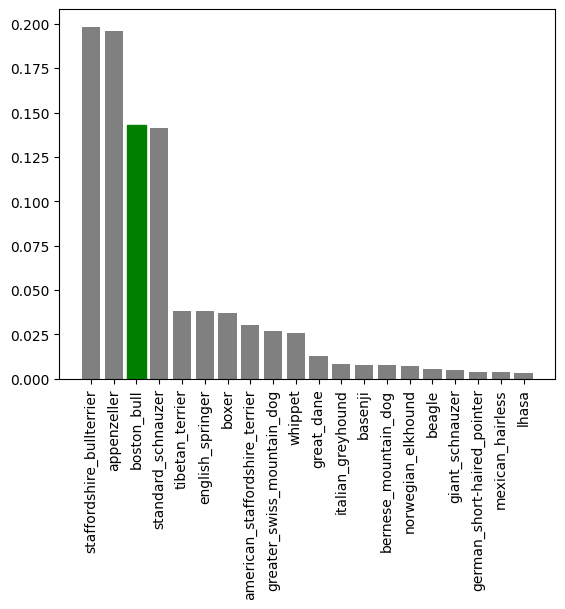

In [92]:
plot_pred_conf(predictions, val_labels, n=9)

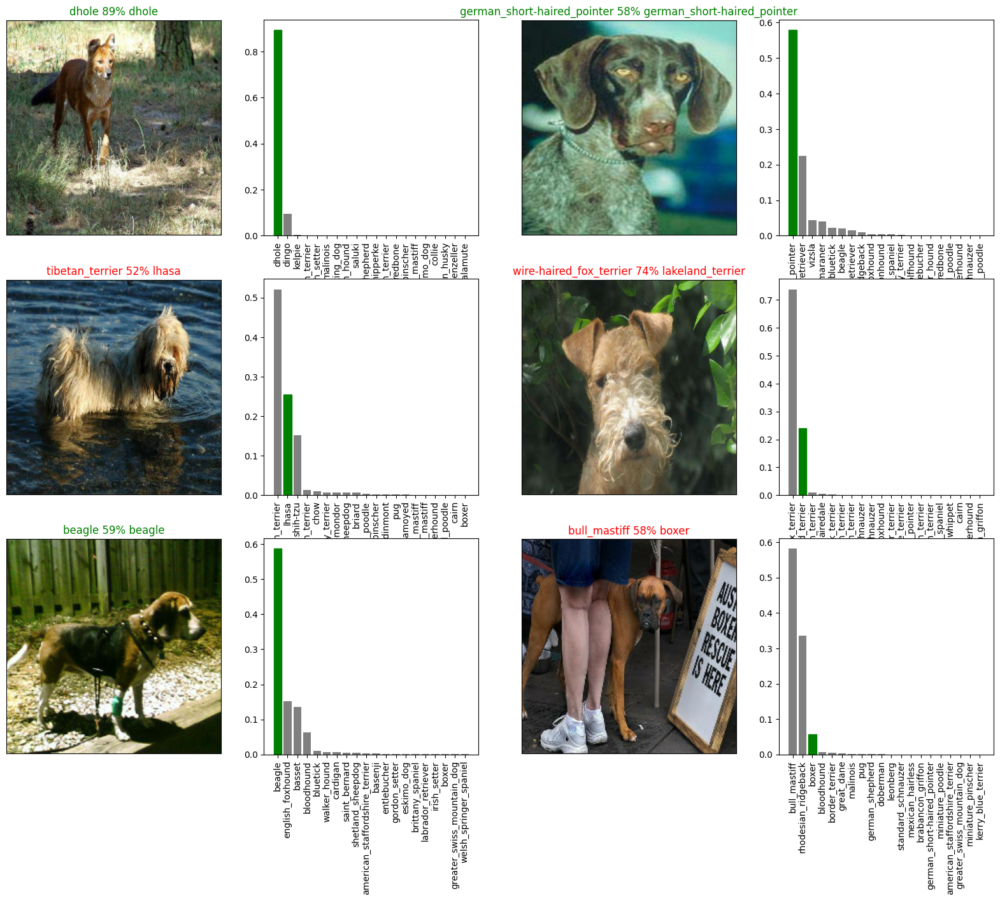

In [93]:
# Lets check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
             labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.show()

# Saving and reloading a trained model

In [94]:
# Create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    """
    modeldir = os.path.join("/kaggle/working/",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + "-" + suffix + ".h5" # save format of model
    print(f"Saving model to: {model_path}....")
    model.save(model_path)
    return model_path

In [95]:
# Create a function to load a trained model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

    return model

In [96]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /kaggle/working/20231202-19301701545419-1000-images-mobilenetv2-Adam.h5....


'/kaggle/working/20231202-19301701545419-1000-images-mobilenetv2-Adam.h5'

In [108]:
# Load a trained model
loaded_1000_image_model = load_model("/content/dogvision/20230925-17061695661582-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/dogvision/20230925-17061695661582-1000-images-mobilenetv2-Adam.h5


OSError: ignored

In [98]:
# Evaluate the pre-saved model
model.evaluate(val_data)

13/13 [==============================] - 27s 2s/step - loss: 0.8056 - accuracy: 0.7675


[0.8056359887123108, 0.7674999833106995]

In [100]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

NameError: ignored

# Training a big dog model (on the full data)

In [101]:
len(X), len(y)

(10222, 10222)

In [102]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [103]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [104]:
# Create a model for full model
full_model = create_model()# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


In [109]:
# Fit the full model to the full data
full_model.fit(x=full_data,
              epochs=3,
              callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/3
320/320 [==============================] - 705s 2s/step - loss: 0.3459 - accuracy: 0.9012
Epoch 2/3
320/320 [==============================] - 694s 2s/step - loss: 0.1992 - accuracy: 0.9499
Epoch 3/3
320/320 [==============================] - 709s 2s/step - loss: 0.1248 - accuracy: 0.9731


# Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

We created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames
* Convert the filename into the test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels.
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [113]:
# Load test images filenames
test_path = "/content/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/data/test/0bacfc339a38770af17ed464da321641.jpg',
 '/content/data/test/9cda2f95e578b99aa002d8ac2110c4fc.jpg',
 '/content/data/test/6ca7b65a34be7ab2e90203c844946b1b.jpg',
 '/content/data/test/7308c95772b943b4603d4d48c4d9f058.jpg',
 '/content/data/test/0f075ef05225932dba12fb636783680c.jpg',
 '/content/data/test/53c6f31809a302927001c608343275a1.jpg',
 '/content/data/test/068a1de8f738cd6b99657974c84f5d40.jpg',
 '/content/data/test/599023893bc3656005623501aac7f3d5.jpg',
 '/content/data/test/b563fc842cc349435c065406622f7816.jpg',
 '/content/data/test/f49dbff2463687f867bfe1bc88f0a7c3.jpg']

In [114]:
len(test_filenames)

10357

In [115]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [116]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [120]:
# Make predictions on test data batch using the loaded full model
test_predictions = full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 710s 2s/step


In [124]:
test_predictions[:10]

array([[1.6687174e-07, 1.3145830e-03, 4.2269451e-07, ..., 3.3834032e-04,
        4.0216282e-06, 1.9189326e-06],
       [2.5022399e-07, 1.5678364e-04, 5.6709810e-06, ..., 1.3708184e-04,
        4.1724783e-07, 6.5443837e-09],
       [7.2753870e-08, 1.9465118e-05, 2.3577044e-05, ..., 9.7361529e-01,
        1.2233062e-04, 7.0600386e-08],
       ...,
       [5.6449248e-06, 1.3139766e-06, 4.8469781e-07, ..., 1.5232463e-05,
        3.4215594e-07, 1.1204564e-08],
       [6.8048024e-08, 4.9355235e-06, 9.8690327e-07, ..., 3.7876403e-01,
        3.4706248e-04, 2.2249787e-07],
       [5.1225779e-06, 2.4330689e-07, 2.1678034e-06, ..., 1.3739913e-04,
        3.9988594e-05, 3.1642796e-06]], dtype=float32)

In [125]:
test_predictions.shape

(10357, 120)

In [126]:
# First prediction
index = 42
print(predictions[0])
print(f"Maxvalue (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predictions label: {unique_breeds[np.argmax(predictions[index])]}")

[4.73716646e-05 1.13815777e-01 4.17083393e-05 1.11726709e-02
 9.55582829e-04 6.00653584e-06 4.23559186e-06 3.93720147e-05
 1.08714600e-03 8.89036528e-05 1.59193267e-04 2.57235806e-04
 1.18554533e-04 1.25596242e-04 1.52955865e-02 2.26007796e-05
 2.43630402e-05 1.02462724e-01 1.15101735e-04 1.19034499e-04
 5.23497388e-02 1.17453316e-03 8.08252007e-05 1.28522202e-01
 3.46452580e-05 1.63495801e-02 3.05090342e-02 1.27900814e-04
 8.69833675e-05 4.34850263e-05 2.30381149e-03 1.40233577e-04
 1.77513016e-03 1.07306929e-03 1.47602826e-04 6.18548971e-03
 2.31423455e-05 1.34614855e-03 8.36131687e-04 1.74293877e-04
 1.11632957e-03 2.16579341e-04 1.35521550e-04 1.56556474e-04
 1.68237511e-05 1.33291658e-04 6.58598961e-04 6.84104452e-05
 2.10671267e-03 1.85505502e-04 5.30298203e-05 6.34195283e-04
 4.43318073e-04 1.07652450e-04 5.49283031e-05 9.87628027e-06
 6.71567477e-06 3.39699618e-04 8.43765520e-06 7.74058700e-02
 8.19830748e-05 1.27533640e-05 3.97104923e-05 2.57203283e-05
 1.87133206e-03 3.027488

In [127]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
    """
    Turns an array of predicitions probabilities into labels.
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label= get_pred_label(predictions[81])
pred_label

'mexican_hairless'